In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import os
base_dir = '/content/drive/My Drive/imgBigOne'

train_dir = os.path.join(base_dir,'train')
#os.mkdir(train_dir)

validation_dir = os.path.join(base_dir,'validation')
#os.mkdir(validation_dir)

test_dir = os.path.join(base_dir,'test')
#os.mkdir(test_dir)

In [9]:
import csv
import math

movie_id_rate_dict = {}

row_names = ['movie_id', 'movie_rating']
with open('/content/drive/My Drive/movie_id_rating_bigOne.csv', 'r', newline='') as in_csv:
    reader = csv.DictReader(in_csv, fieldnames=row_names, delimiter=',')
    for row in reader:
        movie_id = int(row['movie_id'])
        movie_rating = math.floor(float(row['movie_rating']))
        #print(movie_id, '\t', movie_rating)
        
        movie_id_rate_dict[movie_id] = movie_rating
    print(len(movie_id_rate_dict))
    
    
movie_id_rate_dict[100]

5039


7

In [10]:
list_of_movieID = list(movie_id_rate_dict.keys())
list_of_movieID[5]

7

In [0]:
import shutil
train_limit = 3800
validation_limit = 4800
test_limit = 5039

fnames = ['{}.jpg'.format(list_of_movieID[i]) for i in range(train_limit-500,train_limit)]
for fname in fnames:
  src = os.path.join(validation_dir,fname)
  dst = os.path.join(train_dir,fname)
  shutil.move(src,dst)

In [13]:
print('total training image: ', len(os.listdir(train_dir)))
print('total validation image: ', len(os.listdir(validation_dir)))
print('total test image: ', len(os.listdir(test_dir)))

total training image:  3800
total validation image:  1000
total test image:  239


In [14]:
import numpy as np
from keras.preprocessing import image

fnames = ['{}.jpg'.format(list_of_movieID[i]) for i in range(train_limit)]
out = []

for fname in fnames:
  src = os.path.join(base_dir,fname)
  img = image.load_img(src, target_size=(256,170), interpolation='bilinear')
  img_tensor = image.img_to_array(img)
  img_tensor /= 255
  #img_tensor = (img_tensor / 127.5) - 1.
  out.append(img_tensor)
print(len(out))

X_train = np.concatenate([arr[np.newaxis] for arr in out])
X_train.shape

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:2496: DecompressionBombWarning: Image size (97200000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning)


3800


(3800, 256, 170, 3)

In [15]:
fnames = ['{}.jpg'.format(list_of_movieID[i]) for i in range(train_limit,validation_limit)]
out = []

for idx, fname in enumerate(fnames, train_limit):
  src = os.path.join(base_dir,fname)
  img = image.load_img(src, target_size=(256,170),interpolation='bilinear')
  img_tensor = image.img_to_array(img)
  img_tensor /= 255
  #img_tensor = (img_tensor / 127.5) - 1.
  #img_tensor = np.expand_dims(img_tensor, axis=0)
  out.append(img_tensor)
  #print(idx)
  #print(img_tensor.shape)
  #out = np.concatenate([img_tensor for img_tensor in ])
print(len(out))

X_validate = np.concatenate([arr[np.newaxis] for arr in out])
X_validate.shape

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:2496: DecompressionBombWarning: Image size (97143904 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning)


1000


(1000, 256, 170, 3)

In [16]:
fnames = ['{}.jpg'.format(list_of_movieID[i]) for i in range(validation_limit,test_limit)]
out = []

for fname in fnames:
  src = os.path.join(base_dir,fname)
  img = image.load_img(src, target_size=(256,170),interpolation='bilinear')
  img_tensor = image.img_to_array(img)
  img_tensor /= 255
  #img_tensor = (img_tensor / 127.5) - 1.
  #img_tensor = np.expand_dims(img_tensor, axis=0)
  out.append(img_tensor)
  #print(img_tensor.shape)
  #out = np.concatenate([img_tensor for img_tensor in ])
print(len(out))

X_test = np.concatenate([arr[np.newaxis] for arr in out])
X_test.shape

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:2496: DecompressionBombWarning: Image size (97778814 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning)
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:2496: DecompressionBombWarning: Image size (97200000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning)


239


(239, 256, 170, 3)

In [17]:
import numpy as np
from keras.utils.np_utils import to_categorical

labels = list(movie_id_rate_dict.values())
tempY = np.array(labels[0:train_limit])
Y_train = to_categorical(tempY,10)
print(Y_train.shape)
Y_train

(3800, 10)


array([[0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]], dtype=float32)

In [18]:
tempY = np.array(labels[train_limit:validation_limit])
Y_validate = to_categorical(tempY,10)
print(Y_validate.shape)
Y_validate

(1000, 10)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.]], dtype=float32)

In [19]:
tempY = np.array(labels[validation_limit:test_limit])
Y_test = to_categorical(tempY,10)
print(Y_test.shape)
Y_test

(239, 10)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [0]:
from keras import layers, models
from keras import regularizers

SIZE = (256,170)

model = models.Sequential()
model.add(layers.Conv2D(32, kernel_size=(3, 3), activation='relu',
                 input_shape=(SIZE[0], SIZE[1], 3)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Dropout(0.25))

model.add(layers.Conv2D(64, kernel_size=(3, 3), activation='relu'))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Dropout(0.25))

model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(10, activation='softmax'))

In [25]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 254, 168, 32)      896       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 252, 166, 32)      9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 126, 83, 32)       0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 126, 83, 32)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 124, 81, 64)       18496     
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 122, 79, 64)       36928     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 61, 39, 64)        0         
__________

In [0]:
from keras import optimizers

model.compile(loss='categorical_crossentropy',
             #optimizer=optimizers.SGD(lr=0.0001),
             #optimizer=optimizers.SGD(lr=0.0001, clipnorm=1.),
             #optimizer=optimizers.SGD(lr=0.0001, decay=1e-6, momentum=0.9, nesterov=True),
             #optimizer=optimizers.RMSprop(lr=0.0001, rho=0.9),
             optimizer=optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
             metrics=['acc'])

In [29]:
from keras.preprocessing.image import ImageDataGenerator

batch_size=32

train_datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    horizontal_flip=True)

valid_datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True)

train_datagen.fit(X_train)
valid_datagen.fit(X_validate)

'''history = model.fit_generator(train_datagen.flow(X_train, Y_train, batch_size=batch_size),
                    steps_per_epoch=len(X_train) / batch_size, 
                    epochs=50,
                    validation_data=(X_validate, Y_validate))'''
history = model.fit_generator(train_datagen.flow(X_train, Y_train, batch_size=batch_size),
                             steps_per_epoch=len(X_train)/batch_size,
                             epochs=50,
                             validation_data=valid_datagen.flow(X_validate, Y_validate, batch_size=batch_size),
                             validation_steps=10)

Epoch 1/50
119/118 [==============================] - 27s 223ms/step - loss: 1.7660 - acc: 0.3136 - val_loss: 1.8196 - val_acc: 0.2719
Epoch 2/50
119/118 [==============================] - 25s 211ms/step - loss: 1.6779 - acc: 0.3447 - val_loss: 1.7067 - val_acc: 0.3219
Epoch 3/50
119/118 [==============================] - 25s 211ms/step - loss: 1.6428 - acc: 0.3522 - val_loss: 1.7581 - val_acc: 0.3094
Epoch 4/50
119/118 [==============================] - 25s 212ms/step - loss: 1.6259 - acc: 0.3518 - val_loss: 1.8708 - val_acc: 0.3108
Epoch 5/50
119/118 [==============================] - 25s 211ms/step - loss: 1.5743 - acc: 0.3716 - val_loss: 1.7076 - val_acc: 0.3187
Epoch 6/50
119/118 [==============================] - 25s 210ms/step - loss: 1.5456 - acc: 0.3879 - val_loss: 1.7301 - val_acc: 0.3156
Epoch 7/50
119/118 [==============================] - 25s 210ms/step - loss: 1.5319 - acc: 0.3845 - val_loss: 1.7838 - val_acc: 0.2568
Epoch 8/50
119/118 [==============================] - 2

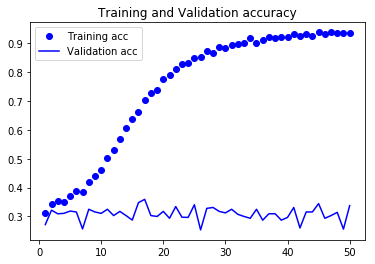

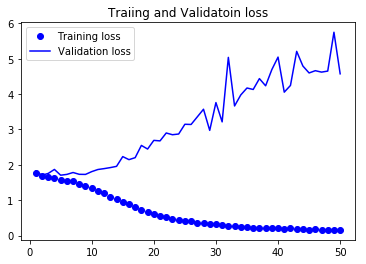

In [30]:
import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1,len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and Validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs,loss,'bo',label='Training loss')
plt.plot(epochs,val_loss,'b',label='Validation loss')
plt.title('Traiing and Validatoin loss')
plt.legend()

plt.show()

In [0]:
pred = model.predict(X_test,batch_size=32)

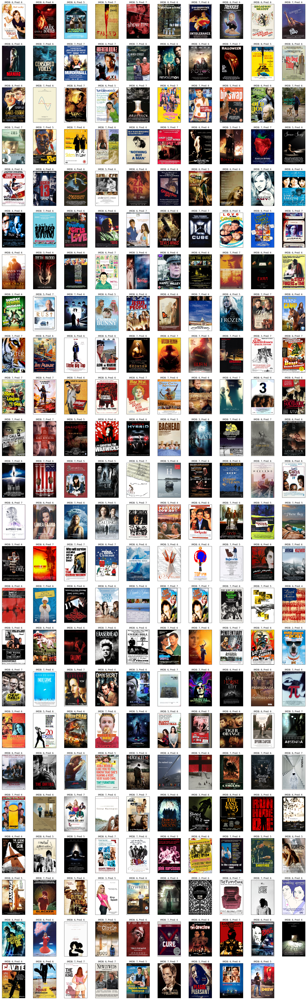

In [32]:
import matplotlib.pyplot as plt
plt.figure(figsize=(30,100))
for i, rate in enumerate(pred):
    plt.subplot(24,10,i+1)
    plt.imshow(X_test[i])
    plt.title("IMDB: {}, Pred: {}".format(np.argmax(Y_test[i]),np.argmax(pred[i])))
    plt.xticks([])
    plt.yticks([])

In [0]:
'''from keras.applications.resnet import ResNet50

conv_base = ResNet50(include_top=False, weights='imagenet', input_shape=(256,170,3)))
conv_base.summary()'''

In [33]:
test_loss, test_accuracy = model.evaluate(X_test, Y_test, batch_size=32)
print('Test loss: %.4f accuracy: %.4f' % (test_loss, test_accuracy))

239/239 [==============================] - 1s 3ms/step
Test loss: 2.8362 accuracy: 0.3347
